# Setup

In [ ]:
import os
import wandb

from kaggle_secrets import UserSecretsClient
from huggingface_hub import login
user_secrets = UserSecretsClient()
hf_token = user_secrets.get_secret("HF_TOKEN")
login(token=hf_token)
os.environ["HF_TOKEN"] = hf_token

wb_token = user_secrets.get_secret("WANDB_TOKEN")
wandb.login(key=wb_token)
os.environ["WANDB_TOKEN"] = wb_token
!export WANDB_PROJECT=Kvasir-VQA-x1_Subtask1
!export WANDB_DISABLED=false

!git clone https://github.com/magnusdtd/MobileSAM.git
%cd MobileSAM
!uv sync

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: magnusdtd (DamTienDat) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Cloning into 'MobileSAM'...
remote: Enumerating objects: 127, done.
remote: Counting objects: 100% (127/127), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 127 (delta 63), reused 104 (delta 40), pack-reused 0 (from 0)
Receiving objects: 100% (127/127), 871.86 KiB | 8.46 MiB/s, done.
Resolving deltas: 100% (63/63), done.
/kaggle/working/MobileSAM
Using CPython 3.12.12 interpreter at: /usr/bin/python3
Creating virtual environment at: .venv
Resolved 98 packages in 16ms
⠙ Preparing packages... (0/96)
⠙ Preparing packages... (0/96)
⠙ Preparing packages... (0/96)
networkx             ------------------------------     0 B/1.97 MiB
⠙ Preparing packages... (0/96)
networkx             ------------------------------     0 B/1.97 MiB
⠙ Preparing packages... (0/96)
networkx             ------------------------------     0 B/1.97 MiB
⠙ Preparing packages... (0/96)
pygments             ------------------------------     0 B/1.17 MiB
networkx             -----------------------

In [2]:
%%writefile configs/mobileSAM.json
{
    "dataset": {
        "dataset_dir": "/kaggle/input/datasets/magnusdtd2/rice-coffee-leaf-disease/coffee_leaf_disease",
        "max_bbox_shift": 20,
        "num_workers": 4
    },
    "model": {
        "checkpoint_path": "./outputs/weights/mobile_sam.pt",
        "type": "vit_t",
        "image_size": 1024,
        "save_path": "./outputs/logs"
    },
    "train": {
        "epochs": 10000,
        "learning_rate": 1e-5,
        "batch_size": 4,
        "val_freq": 5,
        "gradient_accumulation": 1,
        "bf16": false,
        "warmup_step": 250,
        "resume": false
    },
    "visual": {
        "status": true,
        "save_path": "./images",
        "IOU_threshold": 0.5
    },
    "freeze": {
        "freeze_image_encoder": true,
        "freeze_prompt_encoder": true,
        "freeze_mask_decoder": false
    }
}

Overwriting configs/mobileSAM.json


# Training

In [3]:
!uv run -m src.train \
    --config configs/mobileSAM.json \
    --batch_size 8 \
    --epochs 100 \
    --learning_rate 1e-5 \
    --checkpoint_prefix "coffee_" \
    --push_to_hub \
    --hf_repo_id "magnusdtd/ML-Final-Project-MobileSAM"

/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwritin

In [4]:
!cp outputs/logs/coffee_best.pth outputs/weights/coffee_best.pth
!cp outputs/logs/coffee_last.pth outputs/weights/coffee_last.pth
!ls outputs/weights

coffee_best.pth  coffee_last.pth  log.log  mobile_sam.pt


# Convert to ONNX model and quantization

In [5]:
!uv run -m src.export_onnx_model \
    --checkpoint outputs/weights/coffee_best.pth \
    --output outputs/weights/coffee_mobile_sam.onnx \
    --quantize-out outputs/weights/coffee_mobile_sam_quantized.onnx \
    --model-type vit_t

/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwritin

In [6]:
!ls outputs/weights

coffee_best.pth  coffee_mobile_sam.onnx		   log.log
coffee_last.pth  coffee_mobile_sam_quantized.onnx  mobile_sam.pt


In [7]:
from huggingface_hub import HfApi
from pathlib import Path

save_path = Path("/kaggle/working/MobileSAM/outputs/weights/")
hf_repo_id = "magnusdtd/ML-Final-Project-MobileSAM"

print(f"Pushing best model to Hugging Face Hub: {hf_repo_id}")
api = HfApi()

onnx_model_path = save_path / "coffee_mobile_sam.onnx"
if onnx_model_path.exists():
    api.upload_file(
        path_or_fileobj=str(onnx_model_path),
        path_in_repo="coffee_mobile_sam.onnx",
        repo_id=hf_repo_id,
        token=hf_token,
        commit_message="Upload fine-tuned MobileSAM model",
    )
    print("ONNX model pushed successfully.")
else:
    print("ONNX model checkpoint not found for upload.")

quantized_onnx_model_path = save_path / "coffee_mobile_sam_quantized.onnx"
if quantized_onnx_model_path.exists():
    api.upload_file(
        path_or_fileobj=str(quantized_onnx_model_path),
        path_in_repo="coffee_mobile_sam_quantized.onnx",
        repo_id=hf_repo_id,
        token=hf_token,
        commit_message="Upload fine-tuned MobileSAM model",
    )
    print("Quantized ONNX model pushed successfully.")
else:
    print("Quantized ONNX model checkpoint not found for upload.")

Pushing best model to Hugging Face Hub: magnusdtd/ML-Final-Project-MobileSAM


Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

ONNX model pushed successfully.


Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Quantized ONNX model pushed successfully.


In [8]:
!rm -rf outputs/weights/

# Inference

In [9]:
from huggingface_hub import snapshot_download
snapshot_download(
    repo_id="magnusdtd/ML-Final-Project-MobileSAM",
    local_dir="outputs/weights",
    local_dir_use_symlinks=False
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `snapshot_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


Fetching 8 files:   0%|          | 0/8 [00:00<?, ?it/s]

'/kaggle/working/MobileSAM/outputs/weights'

Original Image


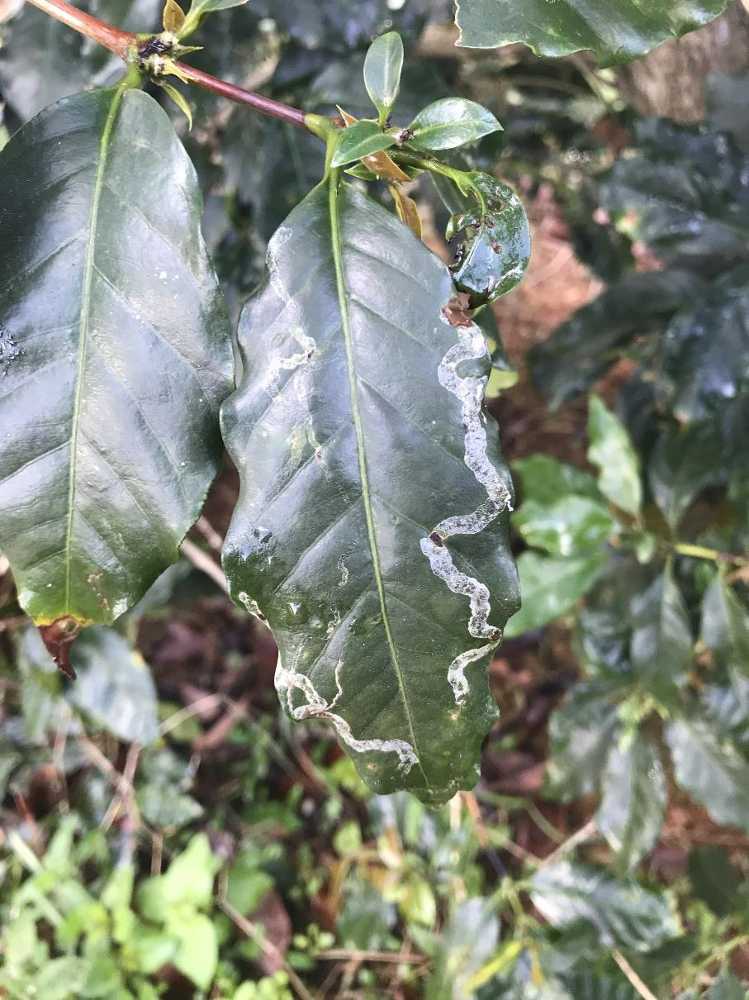


Running Standard PyTorch Checkpoint Inference...


/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwritin

Using device: cpu
Loading model from /kaggle/working/MobileSAM/outputs/weights/coffee_best.pth...

Processing: /kaggle/input/datasets/magnusdtd2/rice-coffee-leaf-disease/coffee_leaf_disease/0/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e.jpg
Found 1 ground-truth bbox(es) in annotations.
Box [269, 178, 631, 970] -> Predicted Class: Benh sau ve bua (Score: 0.9839)
Saved visualization to /kaggle/working/MobileSAM/outputs/samples/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e/visualization.jpg
PyTorch BBox Inference completed!


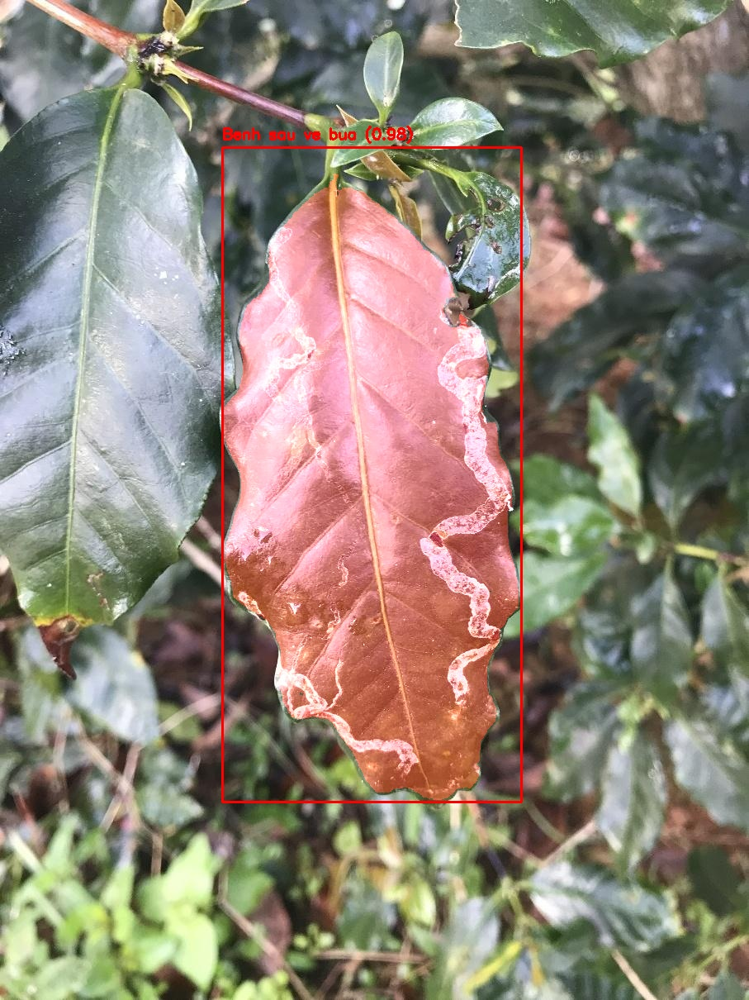


Running FP32 ONNX Model Inference...


/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwritin

Using device: cpu
Loading model from /kaggle/working/MobileSAM/outputs/weights/coffee_best.pth...
Loading ONNX model from /kaggle/working/MobileSAM/outputs/weights/coffee_mobile_sam.onnx...

Processing: /kaggle/input/datasets/magnusdtd2/rice-coffee-leaf-disease/coffee_leaf_disease/0/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e.jpg
Found 1 ground-truth bbox(es) in annotations.
Box [269, 178, 631, 970] -> Predicted Class (ONNX): Benh sau ve bua (Score: 0.9839)
Saved visualization to /kaggle/working/MobileSAM/outputs/samples/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e/visualization_coffee_mobile_sam.jpg
ONNX BBox Inference completed!


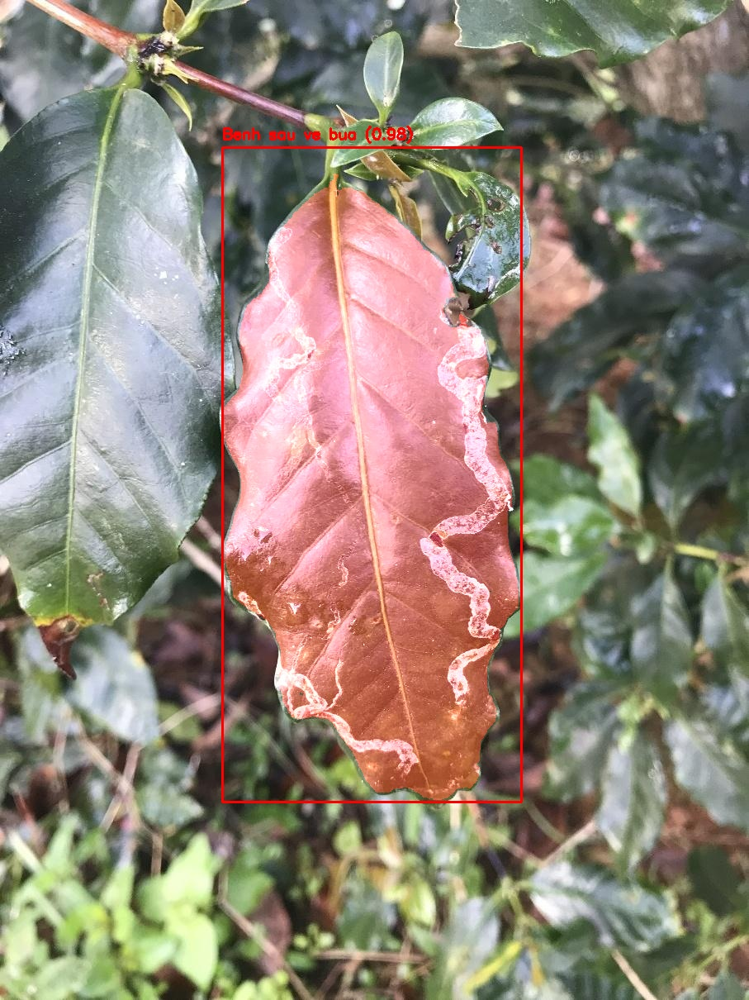


Running Quantized INT8 ONNX Inference...


/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/kaggle/working/MobileSAM/.venv/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/kaggle/working/MobileSAM/mobile_sam/modeling/tiny_vit_sam.py:674: UserWarning: Overwritin

Using device: cpu
Loading model from /kaggle/working/MobileSAM/outputs/weights/coffee_best.pth...
Loading ONNX model from /kaggle/working/MobileSAM/outputs/weights/coffee_mobile_sam_quantized.onnx...

Processing: /kaggle/input/datasets/magnusdtd2/rice-coffee-leaf-disease/coffee_leaf_disease/0/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e.jpg
Found 1 ground-truth bbox(es) in annotations.
Box [269, 178, 631, 970] -> Predicted Class (ONNX): Benh sau ve bua (Score: 0.9412)
Saved visualization to /kaggle/working/MobileSAM/outputs/samples/IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e/visualization_coffee_mobile_sam_quantized.jpg
ONNX BBox Inference completed!


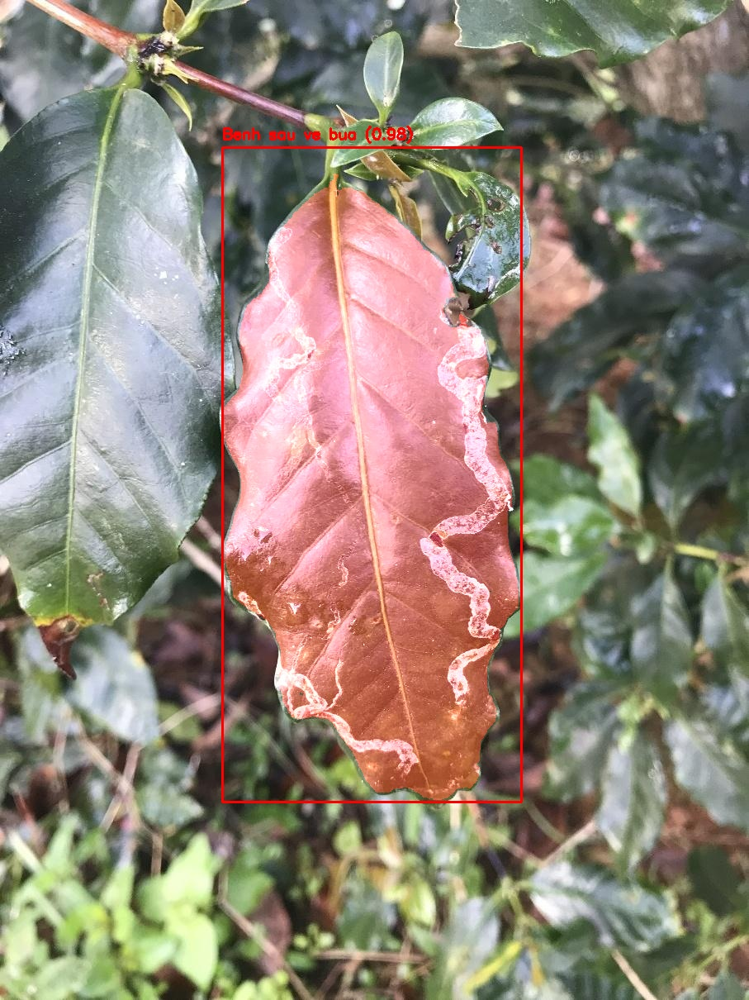

In [10]:
import os
import subprocess
from PIL import Image
from pathlib import Path
from IPython.display import display

img_name = "IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e"
disease_type = "0"
model_type = "vit_t"

input_dir = f"/kaggle/input/datasets/magnusdtd2/rice-coffee-leaf-disease/coffee_leaf_disease/{disease_type}"
output_dir = "/kaggle/working/MobileSAM/outputs/samples"
Path(output_dir).mkdir(parents=True, exist_ok=True)

input_path = os.path.join(input_dir, f"{img_name}.jpg")
checkpoint_path = "/kaggle/working/MobileSAM/outputs/weights/coffee_best.pth"
onnx_fp32 = "/kaggle/working/MobileSAM/outputs/weights/coffee_mobile_sam.onnx"
onnx_int8 = "/kaggle/working/MobileSAM/outputs/weights/coffee_mobile_sam_quantized.onnx"
vis_path = os.path.join(output_dir, img_name, "visualization.jpg")

print("=" * 60)
print("Original Image")
print("=" * 60)
try:
    display(Image.open(input_path))
except Exception as e:
    print(f"Error loading original image: {e}")

def run_and_visualize(mode_name, command_args):
    print("\n" + "=" * 60)
    print(f"Running {mode_name} Inference...")
    print("=" * 60)

    subprocess.run(command_args, check=True)

    try:
        vis_img = Image.open(vis_path)
        display(vis_img)
    except Exception as e:
        print(f"An error occurred loading {mode_name} visualization: {e}")

cmd_pytorch = [
    "uv", "run", "-m", "src.infer_bbox",
    "--input", input_path,
    "--output", output_dir,
    "--checkpoint", checkpoint_path,
    "--dataset", "coffee",
    "--device", "cpu",
]
run_and_visualize("Standard PyTorch Checkpoint", cmd_pytorch)

cmd_onnx_fp32 = [
    "uv", "run", "-m", "src.infer_bbox",
    "--input", input_path,
    "--output", output_dir,
    "--checkpoint", checkpoint_path,
    "--onnx", onnx_fp32,
    "--dataset", "coffee",
    "--device", "cpu",
]
run_and_visualize("FP32 ONNX Model", cmd_onnx_fp32)

cmd_onnx_int8 = [
    "uv", "run", "-m", "src.infer_bbox",
    "--input", input_path,
    "--output", output_dir,
    "--checkpoint", checkpoint_path,
    "--onnx", onnx_int8,
    "--dataset", "coffee",
    "--device", "cpu",
]
run_and_visualize("Quantized INT8 ONNX", cmd_onnx_int8)

In [11]:
!ls /kaggle/working/MobileSAM/outputs/weights

coffee_best.pth			  rice_best.pth
coffee_mobile_sam.onnx		  rice_mobile_sam.onnx
coffee_mobile_sam_quantized.onnx  rice_mobile_sam_quantized.onnx
README.md


In [12]:
!ls /kaggle/working/MobileSAM/outputs/samples

IMG_2160_2_JPG.rf.a25788a8e8b74a10dd2db76b158e7c6e
